<a href="https://colab.research.google.com/github/trappertwo/rPPG_experiments/blob/main/swinir_with_cropped_video.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Set Up

In [1]:
!python --version
# Imports
import numpy as np
import pandas as pd
import math
import matplotlib.pyplot as plt

!pip install -q mediapy
import mediapy as media


Python 3.11.13
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 25.7 MB/s eta 0:00:00


In [2]:
### UBFC-rPPG dataset in drive folder
### (TODO) Figure out how to import data set directly into colab
from google.colab import drive

drive.mount('/content/drive')
#filepath = '/content/drive/MyDrive/research_project/'
filepath = '/content/drive/MyDrive/research_project/data/UBFC-rPPG/DATASET_2/subject1/vid.avi' # @param {type: "string"}
!ls -l $filepath

Mounted at /content/drive
-r-------- 1 root root 1425830568 Nov 16  2017 /content/drive/MyDrive/research_project/data/UBFC-rPPG/DATASET_2/subject1/vid.avi


In [3]:
video = media.read_video(filepath)

In [4]:
videos = {'Original': video[:10]}
media.show_videos(videos, fps=30)

In [38]:
## Preprocessing - face detection
import cv2
import datetime
import math
from cv2 import dnn_superres


def read_video(video_file):
    """Reads a video file, returns frames(T, H, W, 3) """
    VidObj = cv2.VideoCapture(video_file)
    VidObj.set(cv2.CAP_PROP_POS_MSEC, 0)
    success, frame = VidObj.read()
    frames = list()
    while success:
      frame = cv2.cvtColor(np.array(frame), cv2.COLOR_BGR2RGB)
      frame = np.asarray(frame)
      frames.append(frame)
      success, frame = VidObj.read()
    return np.asarray(frames)

def face_detection(frame, backend, use_larger_box=False, larger_box_coef=1.0):
        """Face detection on a single frame.

        Args:
            frame(np.array): a single frame.
            backend(str): backend to utilize for face detection.
            use_larger_box(bool): whether to use a larger bounding box on face detection.
            larger_box_coef(float): Coef. of larger box.
        Returns:
            face_box_coor(List[int]): coordinates of face bouding box.
        """
        if backend == "HC":
            # Use OpenCV's Haar Cascade algorithm implementation for face detection
            # This should only utilize the CPU
            detector = cv2.CascadeClassifier(
            '/content/drive/MyDrive/research_project/DATASETS/haarcascade_frontalface_default.xml')

            # Computed face_zone(s) are in the form [x_coord, y_coord, width, height]
            # (x,y) corresponds to the top-left corner of the zone to define using
            # the computed width and height.
            face_zone = detector.detectMultiScale(frame)

            if len(face_zone) < 1:
                print("ERROR: No Face Detected")
                face_box_coor = [0, 0, frame.shape[0], frame.shape[1]]
            elif len(face_zone) >= 2:
                # Find the index of the largest face zone
                # The face zones are boxes, so the width and height are the same
                max_width_index = np.argmax(face_zone[:, 2])  # Index of maximum width
                face_box_coor = face_zone[max_width_index]
                print("Warning: More than one faces are detected. Only cropping the biggest one.")
            else:
                face_box_coor = face_zone[0]
        else:
            raise ValueError("Unsupported face detection backend!")

        if use_larger_box:
            face_box_coor[0] = max(0, face_box_coor[0] - (larger_box_coef - 1.0) / 2 * face_box_coor[2])
            face_box_coor[1] = max(0, face_box_coor[1] - (larger_box_coef - 1.0) / 2 * face_box_coor[3])
            face_box_coor[2] = larger_box_coef * face_box_coor[2]
            face_box_coor[3] = larger_box_coef * face_box_coor[3]
        return face_box_coor

1547


""

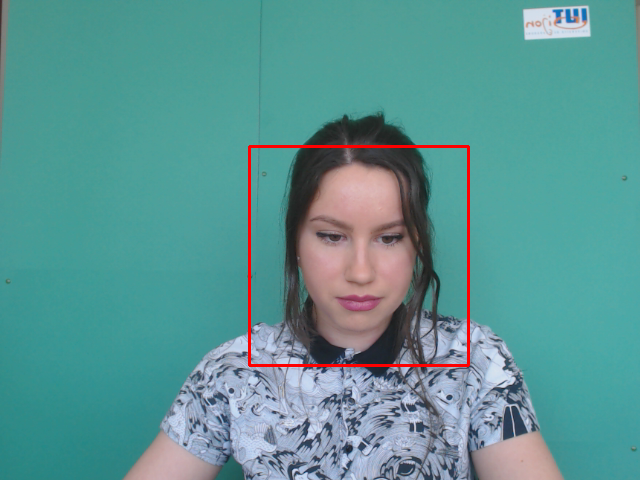

In [50]:
# Check face detection on one frame
print(len(video))
face_box_coor = face_detection(video[1], backend='HC', use_larger_box=True, larger_box_coef=1.5)
new_frame = cv2.rectangle(video[0], (face_box_coor[0], face_box_coor[1]), (face_box_coor[0] + face_box_coor[2], face_box_coor[1] + face_box_coor[3]), (255, 0, 0), 2)
media.show_image(new_frame)

In [39]:
# Face cropping
def crop_face_resize(frames, use_face_detection,  use_larger_box, larger_box_coef, use_dynamic_detection,
                         detection_freq, use_median_box, width, height,
                     denoise=False):
  """Crop face and resize frames.

     Args:
       frames(np.array): Video frames.
       use_face_detection(bool):  Whether crop the face.
       use_dynamic_detection(bool): If False, all the frames use the first frame's bouding box to crop the faces
                                         and resizing.
                                         If True, it performs face detection every "detection_freq" frames.
       detection_freq(int): The frequency of dynamic face detection e.g., every detection_freq frames.
       width(int): Target width for resizing.
       height(int): Target height for resizing.
       use_larger_box(bool): Whether enlarge the detected bouding box from face detection.
       larger_box_coef(float): the coefficient of the larger region(height and weight)
                             the middle point of the detected region will stay still during the process of enlarging.
     Returns:
        resized_frames(list[np.array(float)]): Resized and cropped frames
  """
  # Face Cropping
  if use_dynamic_detection:
    num_dynamic_det = math.ceil(frames.shape[0] / detection_freq)
  else:
    num_dynamic_det = 1
  face_region_all = []
  # Perform face detection by num_dynamic_det" times.
  for idx in range(num_dynamic_det):
    if use_face_detection:
       face_region_all.append(face_detection(frames[detection_freq * idx], "HC", use_larger_box, larger_box_coef))
    else:
       face_region_all.append([0, 0, frames.shape[1], frames.shape[2]])
  if use_median_box:
     # Generate a median bounding box based on all detected face regions
     face_region_median = np.median(np.asarray(face_region_all, dtype='int'), axis=0).astype('int')
  print(np.asarray(face_region_all, dtype='int'))

  # Frame Resizing
  #resized_frames = np.zeros((frames.shape[0], height, width, 3))
  resized_frames = []
  for i in range(0, frames.shape[0]):
    frame = frames[i]
    if use_dynamic_detection:  # use the (i // detection_freq)-th facial region.
      reference_index = i // detection_freq
    else:  # use the first region obtrained from the first frame.
      reference_index = 0
    if use_face_detection:
      if use_median_box:
         face_region = face_region_median
      else:
         face_region = np.asarray(face_region_all, dtype='int')[reference_index]
      frame = frame[max(face_region[1], 0):min(face_region[1] + face_region[3], frame.shape[0]),
         max(face_region[0], 0):min(face_region[0] + face_region[2], frame.shape[1])]

    # Resize the frame
    resized_frame = cv2.resize(frame, (width, height), interpolation=cv2.INTER_AREA)
    resized_frames.append(resized_frame)

  # denoise the resized frames
  if denoise:
    for i in range(0, frames.shape[0]):
      # To remove compression noise from an image using OpenCV
      # "fastNlMeansDenoising" or "fastNlMeansDenoisingMulti"
      # function may be more suitable for removing compression artifacts.
      # "fastNlMeansDenoising" implements the Non-Local Means (NLM) denoising
      # algorithm; Considers similar pixel neighborhoods across the
      # image to reduce noise while preserving edges and details.
      # "fastNlMeansDenoisingMulti" considers similar pixels across
      # multiple frames to denoise.
      # Other methods (less effective for compression noise):
      #    Median filtering: Can be used for basic smoothing but might blur edges.
      #    Gaussian blur: May help with some noise but can also blur details.
      #    Bilateral filtering: Preserves edges better than Gaussian blur but
      #    might not be as effective for compression noise.
      frame = resized_frames[i]
      temporalWindowSize = 3  # Number of adjacent frames to use (must be odd)
      if i in range(2,  frames.shape[0] - 2):
          h = 5  # Filter strength for luminance
          hColor = 5  # Filter strength for color
          templateWindowSize = 7 # Size of the template patch used for searching similar pixels
          searchWindowSize = 21 # Size of the search window to find similar pixels
          # Apply fastNlMeansDenoisingColoredMulti, which considers frames before and after the current
          # frame to denoise.
          start_pos = i - 2
          end_pos = i + 2
          #print("start_pos: " + str(start_pos) + ", end_pos: " + str(end_pos))
          resized_frames[i] = cv2.fastNlMeansDenoisingColoredMulti(
            resized_frames, i, temporalWindowSize, h, hColor, templateWindowSize, searchWindowSize)
          if i % 10 == 0:
            print("processed " + str(i))
            print(datetime.datetime.now().strftime("%H:%M:%S"))
      else:
          # Apply fastNlMeansDenoisingColored, which considers similar regions within the frame
          # to denoise.
          resized_frames[i] = cv2.fastNlMeansDenoisingColored(frame, None, 5, 5, 7, 21)

  return np.array(resized_frames)

def frames_to_video(frames, output_path, fps=30):
    """Converts a sequence of frames to an MPEG4 video.

    Args:
        frames: A list of frames (numpy arrays) to be converted to a video.
        output_path: Name of the output video file (e.g., 'output.mp4').
        fps: Frames per second for the output video.
    """

    height, width, _ = frames[0].shape
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')  # Codec for MPEG-4
    video_writer = cv2.VideoWriter(output_path, fourcc, fps, (width, height))

    for frame in frames:
      frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
      video_writer.write(frame_rgb)

    video_writer.release()

In [51]:
PREPROCESSED_PATH = '/tmp/' # @param{type: "string"}
dirname = 'subject1' # @param{type: "string"}
path = os.path.join(PREPROCESSED_PATH, dirname)
if not os.path.isdir(path):
  os.mkdir(path)
preprocessed_data = crop_face_resize(video, use_face_detection=True,  use_larger_box=True, larger_box_coef=1.5, use_dynamic_detection=False, detection_freq=32, use_median_box=False, width=144, height=144, denoise=False)
print("Writing " + os.path.join(PREPROCESSED_PATH, dirname, 'vid.mp4'))
frames_to_video(preprocessed_data, os.path.join(PREPROCESSED_PATH, dirname, 'vid.mp4'))
!ls -l $path

[[249 146 219 219]]
Writing /tmp/subject1/vid.mp4
total 656
-rw-r--r-- 1 root root 669601 Jul 22 07:13 vid.mp4


In [53]:
cropped_video = media.read_video(os.path.join(PREPROCESSED_PATH, dirname, 'vid.mp4'))
videos = {'Original': video[:100], 'Cropped: ': cropped_video[:100]}
media.show_videos(videos, fps=30)